Phase D - CV Integration

In [1]:
import cv2
import itertools as it
import matplotlib.pyplot as plt
import numpy as np
 
MAZE_FILE_NAME = '../PhaseCTests/Maze_3.png'
ROBOT_FILE_NAME = '../PhaseCTests/Robot_3.png'
MAP_FILE_NAME = '../PhaseCTests/MapBuilt_3.txt'
IMAGE_LADYBUG_FILE_NAME = '../Ladybug_small.png'

def readImage(path):
    '''
    Reads the image with the given path and converts it from BGR to RGB.
    '''
    maze_bgr = cv2.imread(path, cv2.IMREAD_COLOR)
    maze_rgb = cv2.cvtColor(maze_bgr, cv2.COLOR_BGR2RGB)
    return maze_bgr, maze_rgb

def mazeContours(maze_bgr):
    
    # creating a maze to be drawn on
    maze_bgr_draw = cv2.imread(MAZE_FILE_NAME)

    # converting maze to hsv
    maze_hsv = cv2.cvtColor(maze_bgr, cv2.COLOR_BGR2HSV)

    # creating magenta mask
    magenta_lower = np.array([148, 175, 200])
    magenta_upper = np.array([152, 255, 255])
    magenta_mask = cv2.inRange(maze_hsv, magenta_lower, magenta_upper)

    # masking for magenta
    magenta_masked = cv2.bitwise_and(maze_hsv, maze_hsv, mask=magenta_mask)

    # find edges for magenta masked
    magenta_edges = cv2.Canny(magenta_masked, threshold1=150, threshold2=200, apertureSize=5)

    # find magenta contours
    _, magenta_contours, _ = cv2.findContours(magenta_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # sort magenta contours by area
    magenta_contours = sorted(magenta_contours, reverse=True, key=lambda x : cv2.contourArea(x))

    # cull smaller contours (keep three corner stones)
    magenta_contours = magenta_contours[:3]

    # draw cyan edges for magenta corner stones
    cv2.drawContours(maze_bgr_draw, magenta_contours, -1, (248, 242, 123), 4)

    # creating cyan mask
    cyan_lower = np.array([89, 10, 200])
    cyan_upper = np.array([93, 255, 255])
    cyan_mask = cv2.inRange(maze_hsv, cyan_lower, cyan_upper)

    # masking for cyan
    cyan_masked = cv2.bitwise_and(maze_hsv, maze_hsv, mask=cyan_mask)

    # find edges for cyan masked
    cyan_edges = cv2.Canny(cyan_masked, threshold1=150, threshold2=200, apertureSize=5)

    # find cyan contours
    _, cyan_contours, _ = cv2.findContours(cyan_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # sort cyan contours by area
    cyan_contours = sorted(cyan_contours, reverse=True, key=lambda x : cv2.contourArea(x))

    # cull smaller cyan contours (keep one corner stone)
    cyan_contour = cyan_contours[0]

    # draw magenta edges for cyan corner stones
    cv2.drawContours(maze_bgr_draw, cyan_contours, 0, (246, 27, 242), 4)

    # sanity check
    if len(magenta_contours) < 3:
        print("ERROR: NOT ALL MAGENTA CORNER STONES FOUND")
    if len(cyan_contours) == 0:
        print("ERROR: CYAN CORNER STONE NOT FOUND")

    # display maze with marked cornerstones
    maze_rgb = cv2.cvtColor(maze_bgr_draw, cv2.COLOR_BGR2RGB)
    return maze_rgb, magenta_contours, cyan_contours

# used to create corner point dictionary containing relevant information
def create_corner(contour, colour, LEFT_LOWER, LEFT_UPPER, RIGHT_LOWER, RIGHT_UPPER, TOP_LOWER, TOP_UPPER, BOTTOM_LOWER, BOTTOM_UPPER):
    m = cv2.moments(contour)
    cx = int(m['m10']/m['m00'])
    cy = int(m['m01']/m['m00'])
    return {
        'colour': colour,
        'x' : cx,
        'y' : cy,
        'id' : left_or_right(cx, LEFT_LOWER, LEFT_UPPER, RIGHT_LOWER, RIGHT_UPPER) + top_or_bottom(cy, TOP_LOWER, TOP_UPPER, BOTTOM_LOWER, BOTTOM_UPPER),
    }

# used to determine the location of the point on the original maze 
def left_or_right(x, LEFT_LOWER, LEFT_UPPER, RIGHT_LOWER, RIGHT_UPPER):
    # left
    if (x >= LEFT_LOWER and x <= LEFT_UPPER):
        return 0
    # right
    elif (x >= RIGHT_LOWER and x <= RIGHT_UPPER):
        return 1

# used to determine the location of the point on the original maze 
def top_or_bottom(y, TOP_LOWER, TOP_UPPER, BOTTOM_LOWER, BOTTOM_UPPER):
    # top
    if (y >= TOP_LOWER and y <= TOP_UPPER):
        return 0
    # bottom
    elif (y > BOTTOM_LOWER and y <= BOTTOM_UPPER):
        return 2

# orders the points to be used for the perspective transform
def sort_corners(cyan, magenta):
    # ordered corners
    corner_1 = None
    corner_2 = None
    corner_3 = None
    # ordering depending on where the cyan corner is
    if (cyan.get('id') == 0):
        corner_1 = magenta.get('1')
        corner_2 = magenta.get('2')
        corner_3 = magenta.get('3')
    elif (cyan.get('id') == 1):
        corner_1 = magenta.get('3')
        corner_2 = magenta.get('0')
        corner_3 = magenta.get('2')
    elif (cyan.get('id') == 2):
        corner_1 = magenta.get('0')
        corner_2 = magenta.get('3')
        corner_3 = magenta.get('1')
    elif (cyan.get('id') == 3):
        corner_1 = magenta.get('2')
        corner_2 = magenta.get('1')
        corner_3 = magenta.get('0')
    
    # add ordered corners to the list
    ordered = [[cyan.get('x'), cyan.get('y')]]
    ordered.append([corner_1.get('x'), corner_1.get('y')])
    ordered.append([corner_2.get('x'), corner_2.get('y')])
    ordered.append([corner_3.get('x'), corner_3.get('y')])
    return ordered

def perspectiveTransform(maze_bgr, maze_contours, magenta_contours, cyan_contours):
    
    LEFT_LOWER = 0
    LEFT_UPPER = int((337.5 / 1350) * maze_bgr.shape[1])
    RIGHT_LOWER = int((1012.5 / 1359) * maze_bgr.shape[1])
    RIGHT_UPPER = maze_bgr.shape[1]
    TOP_LOWER = 0
    TOP_UPPER = int((375 / 750) * maze_bgr.shape[0])
    BOTTOM_LOWER = int((375 / 750) * maze_bgr.shape[0])
    BOTTOM_UPPER = maze_bgr.shape[0]
    TL = [0, 0]
    TR = [900, 0]
    BL = [0, 500]
    BR = [900, 500]
    TALL_RES = 500 
    WIDE_RES = 900
    
    # list to store all corner points
    magenta_corners = {}
    cyan_corners = []

    # determing magenta conerstone locations and information
    for cont in magenta_contours:
        corner = create_corner(cont, 'magenta', LEFT_LOWER, LEFT_UPPER, RIGHT_LOWER, RIGHT_UPPER, TOP_LOWER, TOP_UPPER, BOTTOM_LOWER, BOTTOM_UPPER)
        magenta_corners[str(corner.get('id'))] = corner

    # determing cyan conerstone locations and information
    cyan_corners.append(create_corner(cyan_contours[0], 'cyan', LEFT_LOWER, LEFT_UPPER, RIGHT_LOWER, RIGHT_UPPER, TOP_LOWER, TOP_UPPER, BOTTOM_LOWER, BOTTOM_UPPER))

    # creating original and transformed points
    point_original = np.float32(sort_corners(cyan_corners[0], magenta_corners))
    point_transformed = np.float32([TL, TR, BL, BR])

    # determining the homogrpahy matrix
    H = cv2.getPerspectiveTransform(point_original, point_transformed)
    # print(H)

    # transform maze
    maze_bgr_transformed = cv2.warpPerspective(maze_bgr, H, (WIDE_RES, TALL_RES))
    maze_rgb_draw_transformed = cv2.warpPerspective(maze_contours, H, (WIDE_RES, TALL_RES))

    return maze_rgb_draw_transformed, maze_bgr_transformed, H

def internalWalls(maze_transformed_rgb, maze_transformed_bgr):

    # defines
    ROWS = 5
    COLS = 9
    GRID_PIXELS = 100
    WALL_PIXELS = 10
    MID_BUFF = 45
    END_BUFF = 95
    WALL_THRESHOLD = 75
    
    # converting maze to hsv
    maze_hsv = cv2.cvtColor(maze_transformed_bgr, cv2.COLOR_BGR2HSV)

    # creating wall mask
    wall_lower = np.array([16, 85, 215])
    wall_upper = np.array([20, 115, 245])
    wall_mask = cv2.inRange(maze_hsv, wall_lower, wall_upper)

    # masking for the walls and convert to grayscale
    wall_masked = cv2.bitwise_and(maze_hsv, maze_hsv, mask=wall_mask)
    _, _, wall_gray = cv2.split(wall_masked)

    maze_transformed_rgb, vertical = verticalWalls(wall_gray)
    maze_transformed_rgb, horizontal = horizontalWalls(wall_gray)

    return maze_transformed_rgb, horizontal, vertical

# vertical walls
def verticalWalls(wall_gray):
    
    # defines
    ROWS = 5
    COLS = 9
    GRID_PIXELS = 100
    WALL_PIXELS = 10
    MID_BUFF = 45
    END_BUFF = 95
    WALL_THRESHOLD = 75
    
    # detecting and drawing vertical walls
    vertical = np.zeros((ROWS, COLS - 1), dtype=bool)
    for row in range(ROWS):
        y_start = row * GRID_PIXELS + MID_BUFF
        y_end =  y_start + WALL_PIXELS
        for col in range(COLS - 1):        
            x_start = col * GRID_PIXELS + END_BUFF
            x_end = x_start + WALL_PIXELS
            sample = wall_gray[y_start:y_end, x_start:x_end]
            if (np.mean(sample) > WALL_THRESHOLD):
                vertical[row][col] = True
                x1 = col * GRID_PIXELS + GRID_PIXELS
                y1 = row * GRID_PIXELS
                x2 = x1
                y2 = y1 + GRID_PIXELS
                cv2.line(maze_transformed_rgb, (x1, y1), (x2, y2), (255, 0, 0), 4)

    return maze_transformed_rgb, vertical
    
# vertical walls
def horizontalWalls(wall_gray):
    
    # defines
    ROWS = 5
    COLS = 9
    GRID_PIXELS = 100
    WALL_PIXELS = 10
    MID_BUFF = 45
    END_BUFF = 95
    WALL_THRESHOLD = 75
    
    # detecting and drawing horizontal walls
    horizontal = np.zeros((ROWS - 1, COLS), dtype=bool)
    for row in range(ROWS - 1):
        y_start = row * GRID_PIXELS + END_BUFF
        y_end =  y_start + WALL_PIXELS
        for col in range(COLS):        
            x_start = col * GRID_PIXELS + MID_BUFF
            x_end = x_start + WALL_PIXELS
            sample = wall_gray[y_start:y_end, x_start:x_end]
            if (np.mean(sample) > WALL_THRESHOLD):
                horizontal[row][col] = True
                x1 = col * GRID_PIXELS
                y1 = row * GRID_PIXELS + GRID_PIXELS
                x2 = x1 + GRID_PIXELS
                y2 = y1
                cv2.line(maze_transformed_rgb, (x1, y1), (x2, y2), (255, 0, 0), 4)

    return maze_transformed_rgb, horizontal
    
    
    
# to find the angle of line from north
def line_angle_4th_quadrant(head, tail):
    diff_x = head[0] - tail[0]
    diff_y = head[1] - tail[1]
    angle = np.arctan2(-diff_y, diff_x)
    return np.rad2deg(angle % (np.pi * 2))

def markBot(maze_internal_walls, maze_transformed_bgr, H):
    
    GRID_PIXELS = 100
    robot_bgr = cv2.imread(ROBOT_FILE_NAME)
    # converting maze to hsv and gray
    maze_hsv = cv2.cvtColor(maze_transformed_bgr, cv2.COLOR_BGR2HSV)
    maze_gray = cv2.cvtColor(maze_transformed_bgr, cv2.COLOR_BGR2GRAY)

    # creating robot mask
    robot_lower = np.array([35, 50, 50])
    robot_upper = np.array([85, 250, 250])
    robot_mask = cv2.inRange(maze_hsv, robot_lower, robot_upper)

    # masked image for robot
    robot_masked = cv2.bitwise_and(maze_hsv, maze_hsv, mask=robot_mask)

    # find the edges
    robot_edges = cv2.Canny(robot_masked, threshold1=150, threshold2=175, apertureSize=5)

    # find the contours of those edges
    _, robot_contours, _ = cv2.findContours(robot_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # finding the centroid of all the contours
    sum_m00 = 0 # area
    sum_m10 = 0 # area * x
    sum_m01 = 0 # area * y

    for contour in robot_contours:
        M = cv2.moments(contour)
        sum_m00 += M['m00']
        sum_m10 += M['m10']
        sum_m01 += M['m01']

    # centroid of robot contours
    robot_x = int(sum_m10 / sum_m00)
    robot_y = int(sum_m01 / sum_m00)

    # calculating robot co ordinates
    robot_coordinates = (int(robot_y / GRID_PIXELS), int(robot_x / GRID_PIXELS))

    # draw robot location
    cx = int(robot_coordinates[1] * GRID_PIXELS + (GRID_PIXELS / 2))
    cy = int(robot_coordinates[0] * GRID_PIXELS + (GRID_PIXELS / 2))
    radius = int(GRID_PIXELS / 4)
    cv2.circle(maze_internal_walls, (cx, cy), radius, (0, 0, 255), 4)

    heading, location = markBotHeading(cx, cy)
    
    # draw heading
    cv2.putText(maze_internal_walls, heading, location, cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)

    return maze_internal_walls, robot_coordinates, heading

def markBotHeading(cx, cy):
    
    robot_bgr = cv2.imread(ROBOT_FILE_NAME)
    
    # load aruco predefined dictionary
    dictionary = cv2.aruco.Dictionary_get(cv2.aruco.DICT_6X6_250)

    # initialise detector parameters using default values
    parameters = cv2.aruco.DetectorParameters_create()

    # detect the markers in the image
    marker_corners, marker_ids, rejected = cv2.aruco.detectMarkers(robot_bgr, dictionary, parameters=parameters)

    # draw markers
    marked = cv2.aruco.drawDetectedMarkers(robot_bgr, marker_corners, marker_ids)

    # get marker points
    head = None
    tail = None
    for i, marker_id in enumerate(marker_ids):
        if marker_id == 1:
            head = marker_corners[i][0][0]
            tail = marker_corners[i][0][2]

    # find the angle the of the heading
    heading_angle = line_angle_4th_quadrant(head, tail)

    # transform angle offset
    offset = np.rad2deg(-np.arctan2(H[1][0], H[0][0]))
    # referenced: https://answers.opencv.org/question/203890/how-to-find-rotation-angle-from-homography-matrix/

    # calculate total angle
    angle = int(heading_angle + offset) % 360

    # determing heading and location offset
    heading = 'o'
    location = (cx, cy)
    if (angle >= 0 and angle <= 30) or (angle >= 330 and angle <= 360):
        # draw '>'
        heading = '>'
        location = (cx - 10, cy + 10)
    elif angle > 60 and angle <= 120:
        # draw '^'
        heading = '^'
        location = (cx - 11, cy + 9)
    elif angle >= 150 and angle <= 210:
        # draw '<'
        heading = '<'
        location = (cx - 15, cy + 10)
    elif angle >= 240 and angle <= 300:
        # draw 'v'
        heading = 'v'
        location = (cx - 8, cy + 8)

    # sanity check
    if heading == 'o':
        print("ERROR: HEADING NOT FOUND")
        
    return heading, location


def markTarget(maze_marked_bot, maze_transformed_bgr):
    
    # defines
    ROWS = 5
    COLS = 9
    GRID_PIXELS = 100
    WALL_PIXELS = 10
    MID_BUFF = 45
    END_BUFF = 95
    WALL_THRESHOLD = 75
    
    bug_gray = cv2.imread(IMAGE_LADYBUG_FILE_NAME, cv2.IMREAD_GRAYSCALE)
    
    # using surf detectors in a similar manner to that of the week 8 mtrn4110

    # converting maze to gray
    maze_gray = cv2.cvtColor(maze_transformed_bgr, cv2.COLOR_BGR2GRAY)

    # create surf detector
    surf = cv2.xfeatures2d.SURF_create()

    # find the keypoints and descriptors of the maze and bug with surf
    kp_maze, des_maze = surf.detectAndCompute(maze_gray, None) # query
    kp_bug, des_bug = surf.detectAndCompute(bug_gray, None) # train

    # create BFMatcher
    bfm = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

    # match the maze with the target image
    matches = bfm.match(des_maze, des_bug)

    # sort the matches by distance (accuracy)
    matches = sorted(matches, key=lambda x : x.distance)

    # determine the threshold of good matches
    match_threshold = matches[0].distance * 2

    g_m = []

    # create an array to keep count of which grid good matches occur
    count = np.zeros((ROWS, COLS), dtype=np.int8)

    # extract good match locations
    for match in matches:
        if match.distance < match_threshold:
            x, y = kp_maze[match.queryIdx].pt
            count[int(y / GRID_PIXELS)][int(x / GRID_PIXELS)] += 1
            g_m.append(match)

    # calculating target co-ordinates at the cell with most matches
    target_coordinates = np.unravel_index(np.argmax(count, axis=None), count.shape)

    # draw target
    cx = int(target_coordinates[1] * GRID_PIXELS + (GRID_PIXELS / 2))
    cy = int(target_coordinates[0] * GRID_PIXELS + (GRID_PIXELS / 2))
    radius = int(GRID_PIXELS / 4)
    cv2.circle(maze_marked_bot, (cx, cy), radius, (0, 255, 0), 4)

    x1 = cx - int(radius * 0.5 * np.cos(45))
    x2 = cx + int(radius * 0.5 * np.cos(45))
    y1 = cy - int(radius * 0.5 * np.sin(45))
    y2 = cy + int(radius * 0.5 * np.sin(45))
    cv2.line(maze_marked_bot, (x1, y1), (x2, y2), (0, 255, 0), 4)
    cv2.line(maze_marked_bot, (x1, y2), (x2, y1), (0, 255, 0), 4)

    return maze_marked_bot, target_coordinates



# to determine the contents of a cell
def cell_contents(row, col, robot, heading, target):
    ordinates = (row, col)
    if ordinates == robot:
        return  (' ' + heading + ' ')
    elif ordinates == target:
        return ' x '
    else:
        return  '   '
    
def generateMap(maze_target, horizontal, vertical, robot_coordinates, target_coordinates, heading):
    
    ROWS = 5
    COLS = 9
    GRID_PIXELS = 100
    WALL_PIXELS = 10
    MID_BUFF = 45
    END_BUFF = 95
    WALL_THRESHOLD = 75
    
    # defines
    BORDER_H = " --- --- --- --- --- --- --- --- --- "    

    # adding horizontal walls
    horizontal_output = [BORDER_H] # add border
    for row in range(ROWS - 1):
        line = ' ' # padding
        for col in range(COLS):
            if (horizontal[row][col]):
                line += '--- '
            else:
                line += '    '
        horizontal_output.append(line)

    # adding  vertical walls, robot heading and target
    vertical_output = []
    for row in range(ROWS):
        line = '|' # border
        for col in range(COLS - 1):
            line += cell_contents(row, col, robot_coordinates, heading, target_coordinates)
            if (vertical[row][col]):
                line += '|'
            else:
                line += ' '
        # check content of last col
        line += cell_contents(row, COLS - 1, robot_coordinates, heading, target_coordinates)
        line += '|' # border
        vertical_output.append(line)


    # creating the map string
    map_string = ''
    for i in range(ROWS):
        map_string += horizontal_output[i] + '\n'
        map_string += vertical_output[i] + '\n'
    map_string += BORDER_H

    # writing to the map file
    file = open(MAP_FILE_NAME, 'w')
    file.write(map_string)
    file.close()
    
    return map_string

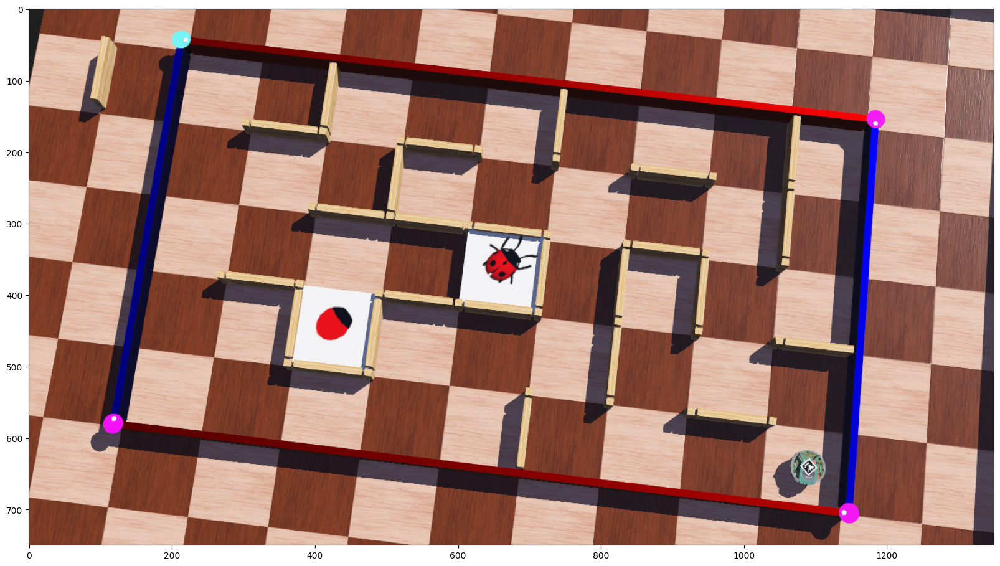

In [2]:
if __name__ == '__main__':
    '''
    Task 1 - Read in an image and display it in RGB mode
    '''
    _, maze_rgb = readImage(MAZE_FILE_NAME) 
    plt.figure(figsize=(20, 20))
    plt.imshow(maze_rgb)
    plt.show()

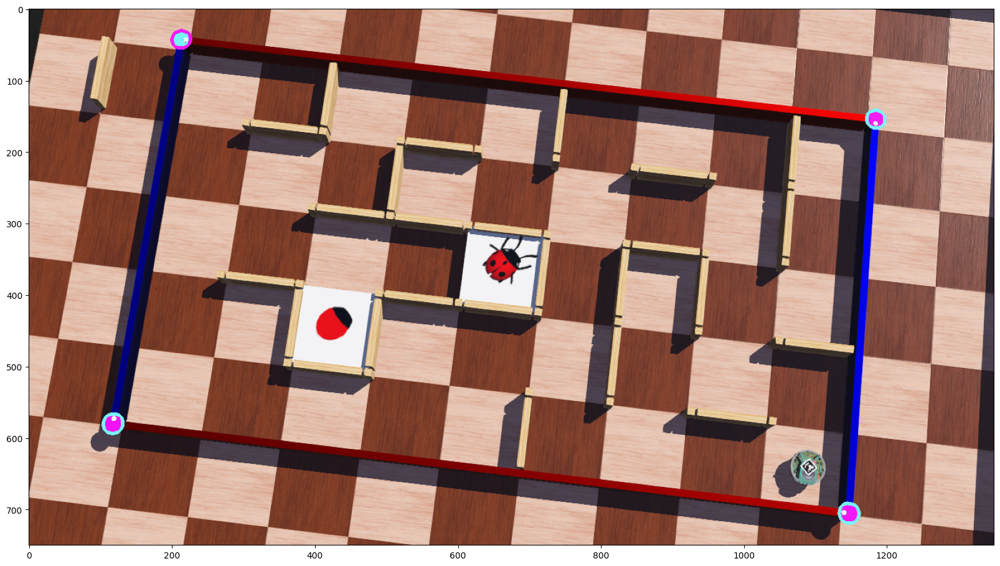

In [3]:
if __name__ == '__main__':
    '''
    Task 2 - Find the four ordered cornerstones of the maze
    '''
    maze_bgr, _ = readImage(MAZE_FILE_NAME)
    maze_contours, magenta_contours, _ = mazeContours(maze_bgr)
    plt.figure(figsize=(20, 20))
    plt.imshow(maze_contours)
    plt.show()

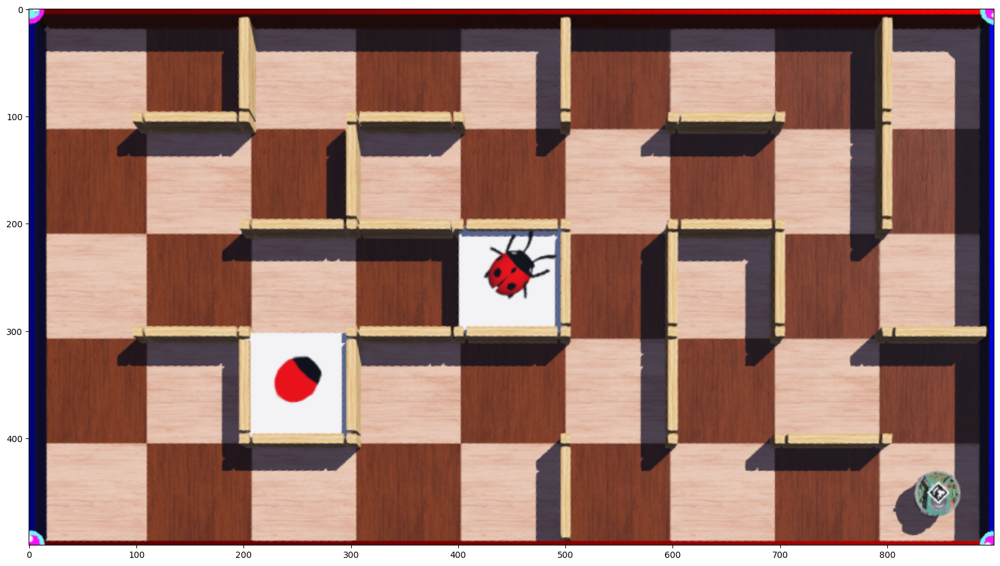

In [4]:
if __name__ == '__main__':
    '''
    Task 3 - Perspective Transform the maze from the original image to a rectangle image
    '''
    maze_bgr, _ = readImage(MAZE_FILE_NAME) 
    maze_contours, magenta_contours, cyan_contours = mazeContours(maze_bgr)
    maze_transformed_rgb, maze_transformed_bgr, _ = perspectiveTransform(maze_bgr, maze_contours, magenta_contours, cyan_contours)
    plt.figure(figsize=(20, 20))
    plt.imshow(maze_transformed_rgb)
    plt.show()

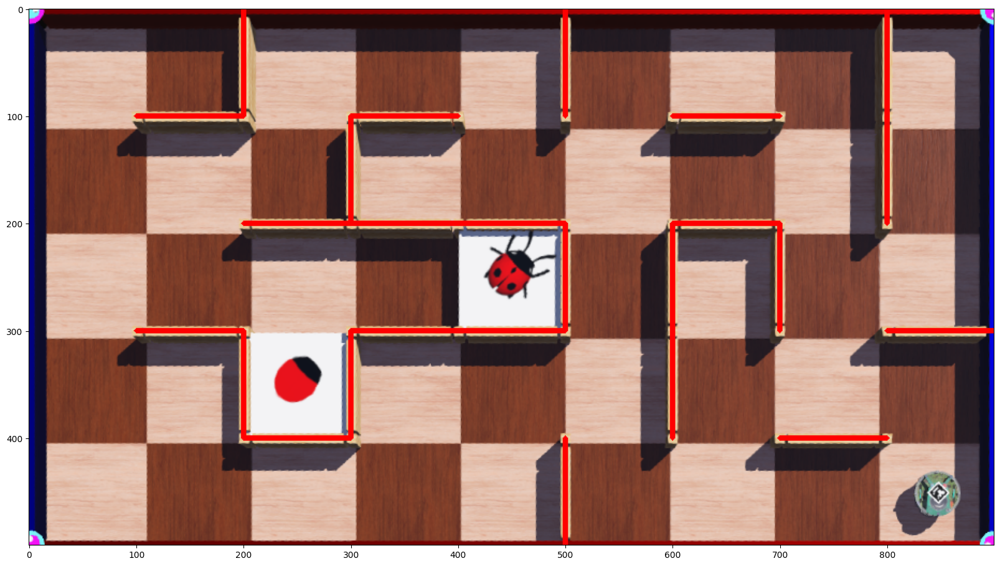

In [5]:
if __name__ == '__main__':
    '''
    Task 4 - Detect all the internal walls
    '''
    maze_bgr, _ = readImage(MAZE_FILE_NAME) 
    maze_contours, magenta_contours, cyan_contours = mazeContours(maze_bgr)
    maze_transformed_rgb, maze_transformed_bgr, _ = perspectiveTransform(maze_bgr, maze_contours, magenta_contours, cyan_contours)
    maze_internal_walls, _, _ = internalWalls(maze_transformed_rgb, maze_transformed_bgr)
    plt.figure(figsize=(20, 20))
    plt.imshow(maze_internal_walls)
    plt.show()

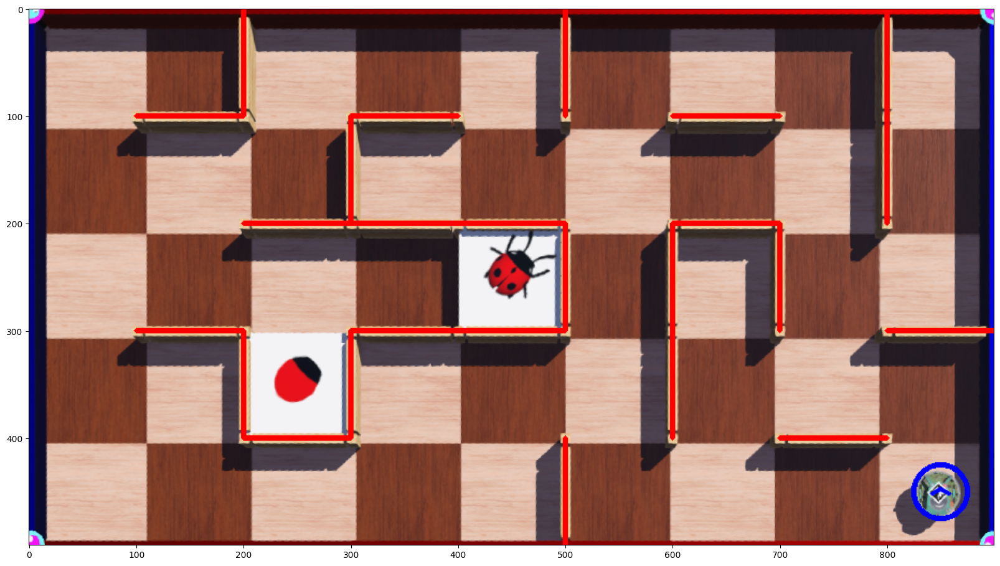

In [6]:
if __name__ == '__main__':
    '''
    Task 5 - Detect the location and heading of the robot
    '''
    maze_bgr, _ = readImage(MAZE_FILE_NAME) 
    maze_contours, magenta_contours, cyan_contours = mazeContours(maze_bgr)
    maze_transformed_rgb, maze_transformed_bgr, H = perspectiveTransform(maze_bgr, maze_contours, magenta_contours, cyan_contours)
    maze_internal_walls, _, _ = internalWalls(maze_transformed_rgb, maze_transformed_bgr)
    maze_marked_bot, _, _ = markBot(maze_internal_walls, maze_transformed_bgr, H) 
    plt.figure(figsize=(20, 20))
    plt.imshow(maze_marked_bot)
    plt.show()

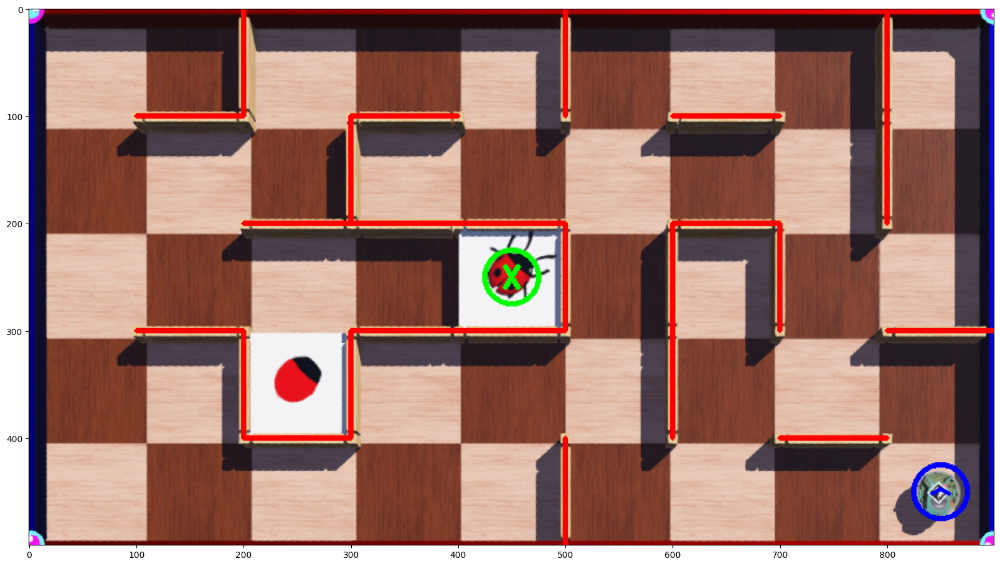

In [7]:
if __name__ == '__main__':
    '''
    Task 6 - Detect the position of the true target
    '''
    maze_bgr, _ = readImage(MAZE_FILE_NAME) 
    maze_contours, magenta_contours, cyan_contours = mazeContours(maze_bgr)
    maze_transformed_rgb, maze_transformed_bgr, H = perspectiveTransform(maze_bgr, maze_contours, magenta_contours, cyan_contours)
    maze_internal_walls, _, _ = internalWalls(maze_transformed_rgb, maze_transformed_bgr)
    maze_marked_bot, _, _ = markBot(maze_internal_walls, maze_transformed_bgr, H) 
    maze_target, _ = markTarget(maze_marked_bot, maze_transformed_bgr)
    plt.figure(figsize=(20, 20))
    plt.imshow(maze_target)
    plt.show()

In [8]:
if __name__ == '__main__':
    '''
    Task 7 - Generate a map and write it to a text file
    '''
    maze_bgr, _ = readImage(MAZE_FILE_NAME) 
    maze_contours, magenta_contours, cyan_contours = mazeContours(maze_bgr)
    maze_transformed_rgb, maze_transformed_bgr, H = perspectiveTransform(maze_bgr, maze_contours, magenta_contours, cyan_contours)
    maze_internal_walls, horizontal, vertical = internalWalls(maze_transformed_rgb, maze_transformed_bgr)
    maze_marked_bot, robot_coordinates, heading = markBot(maze_internal_walls, maze_transformed_bgr, H) 
    maze_target, target_coordinates = markTarget(maze_marked_bot, maze_transformed_bgr)
    maze_final = generateMap(maze_target, horizontal, vertical, robot_coordinates, target_coordinates, heading)
    print(maze_final)

 --- --- --- --- --- --- --- --- --- 
|       |           |           |   |
     ---     ---         ---         
|           |                   |   |
         --- --- ---     ---         
|                 x |   |   |       |
     ---     --- ---             --- 
|       |   |           |           |
         ---                 ---     
|                   |             ^ |
 --- --- --- --- --- --- --- --- --- 
